In [1]:
import os
import shutil
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
CAMERA_CALIBRATION_IMAGES = 'camera_cal/calibration1*'
UNDISTORTED_IMAGES_DIR = 'output_images/undistorted_images'
BIRDS_EYE_VIEW_IMAGES_DIR = 'output_images/birds_eye_view_images'
BIRDS_EYE_TO_ROAD_VIEW_IMAGES_DIR = 'output_images/birds_eye_to_road_view_images'
RED_CHANNEL_THRESH_IMAGES_DIR = 'output_images/red_channel_thresh_images'
YELLOW_HSV_THRESH_IMAGES_DIR = 'output_images/yellow_hsv_thresh_images'
WHITE_HSV_THRESH_IMAGES_DIR = 'output_images/white_hsv_thresh_images'
WHITE_HLS_THRESH_IMAGES_DIR = 'output_images/white_hls_thresh_images'
WHITE_NORMAL_THRESH_IMAGES_DIR = 'output_images/white_normal_thresh_images'
COMBINED_WHITE_THRESH_IMAGES_DIR = 'output_images/combined_white_thresh_images'
COMBINED_COLOR_THRESH_IMAGES_DIR = 'output_images/combined_color_thresh_images'
LINES_ON_TEST_IMAGES = 'output_images/lines_test_images'
POLYGON_ON_TEST_IMAGES = 'output_images/polygon_test_images'
FINAL_IMAGES = 'output_images/final_images'
TEST_IMAGES = 'test_images/*'

In [3]:
def plot_image_set(images, titles, image_type=None):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(images[0], cmap=image_type)
    ax1.set_title(titles[0], fontsize=30)
    ax2.imshow(images[1], cmap=image_type)
    ax2.set_title(titles[1], fontsize=30)

In [4]:
def calibrate_camera(calibration_images, nx, ny):
    objp = np.zeros((ny*nx,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)
    objpoints = [] 
    imgpoints = [] 
    
    for idx, fname in enumerate(calibration_images):
        img = mpimg.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
    
    img_size = (img.shape[1], img.shape[0])
    return cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

In [5]:
def undistort_images_list(images, mtx, dist, save_mode=False):
    undist_images = []
    for idx, fname in enumerate(images):
        filename = fname.split('.')[0].split('/')[-1]
        fileformat = fname.split('.')[-1]
        img = mpimg.imread(fname)
        undist = cv2.undistort(img, mtx, dist, None, mtx)
        undist_images.append(undist)
        plot_image_set([img, undist], titles=['Original Image', 'Undistorted Image'], image_type=None)
        if save_mode:
            if os.path.exists('{}/{}'.format(UNDISTORTED_IMAGES_DIR, filename)):
                shutil.rmtree('{}/{}'.format(UNDISTORTED_IMAGES_DIR, filename))
            os.makedirs('{}/{}'.format(UNDISTORTED_IMAGES_DIR, filename))
            mpimg.imsave('{}/{}/original.{}'.format(UNDISTORTED_IMAGES_DIR, filename, fileformat), img)
            mpimg.imsave('{}/{}/undist.{}'.format(UNDISTORTED_IMAGES_DIR, filename, fileformat), undist)
    return np.array(undist_images)

In [6]:
calibration_images = glob.glob(CAMERA_CALIBRATION_IMAGES)
ret, mtx, dist, rvecs, tvecs = calibrate_camera(calibration_images, 9, 6)

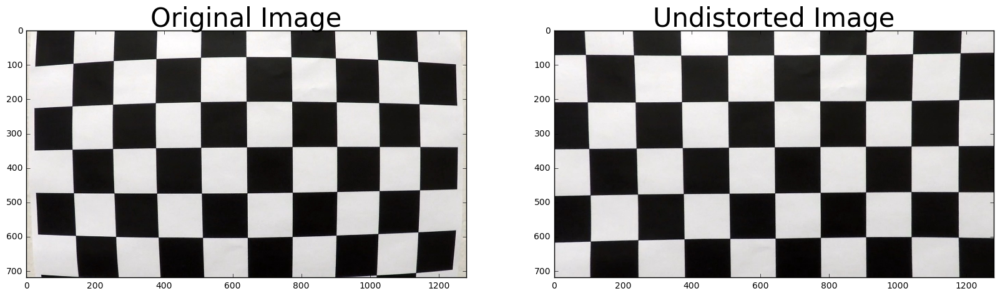

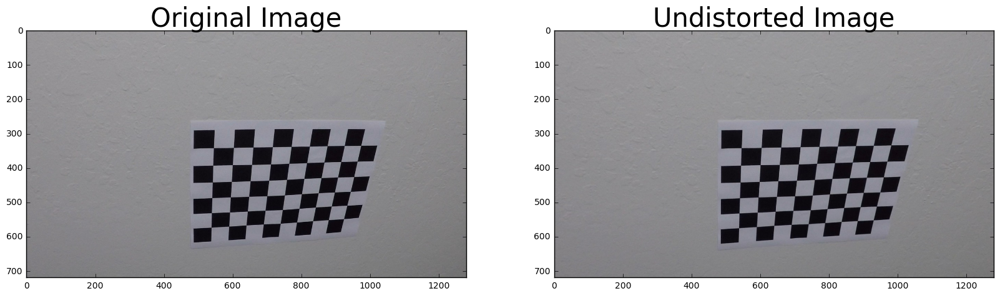

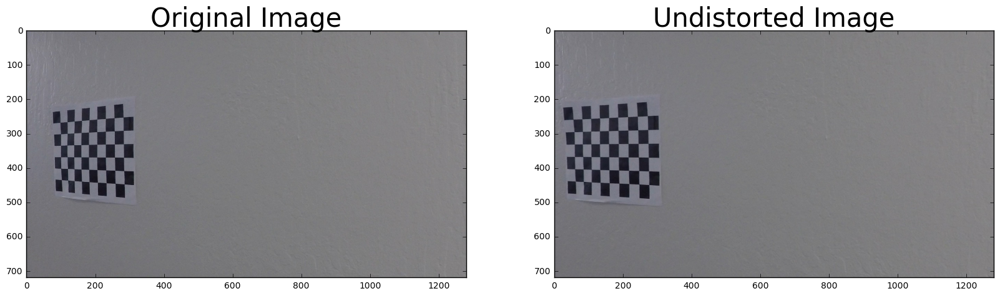

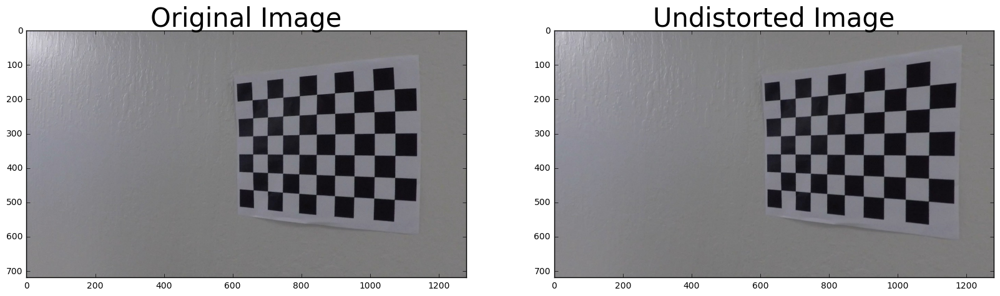

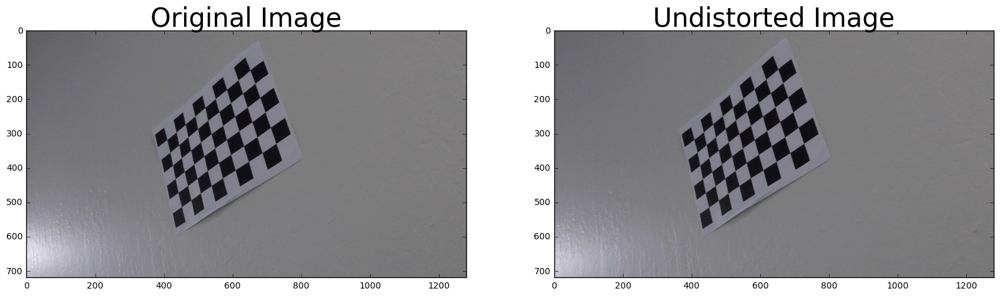

...

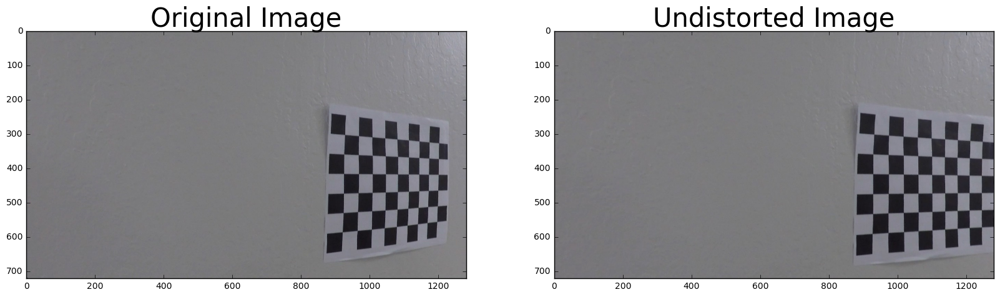

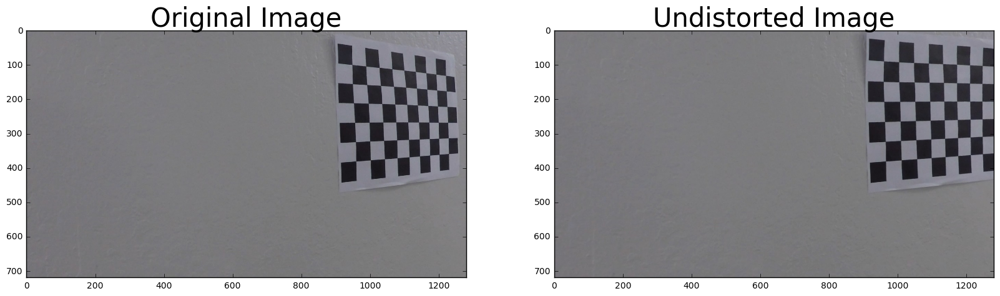

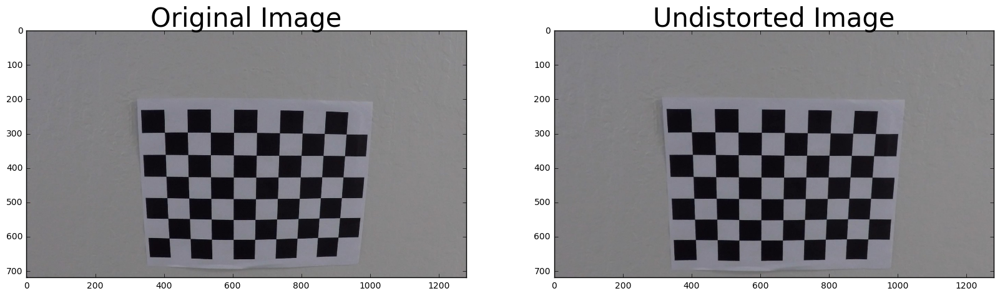

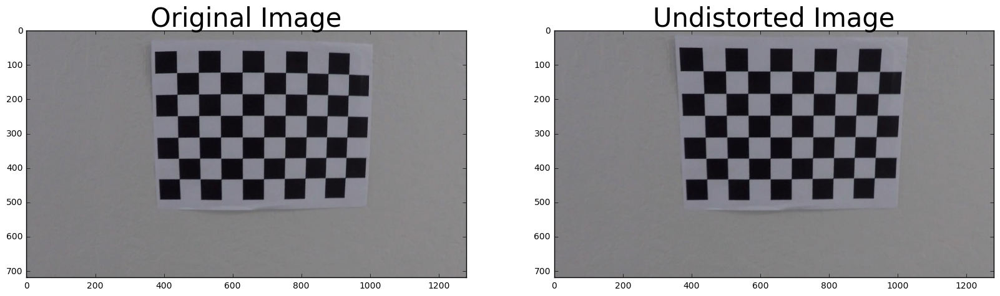

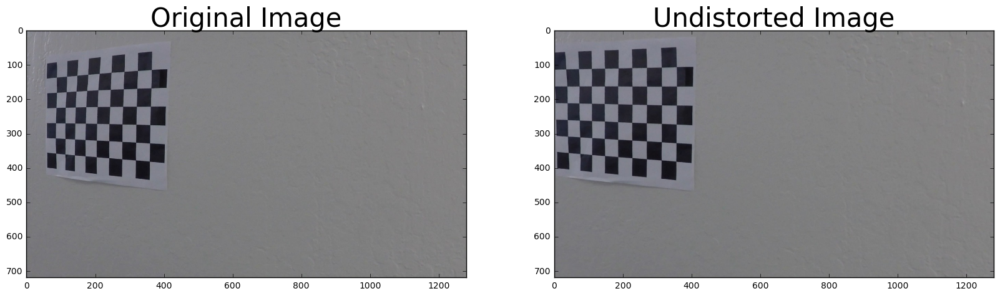

In [7]:
'''Undistort Camera Cal Images'''
undist_calibration_images = undistort_images_list(calibration_images, mtx, dist, save_mode=True)

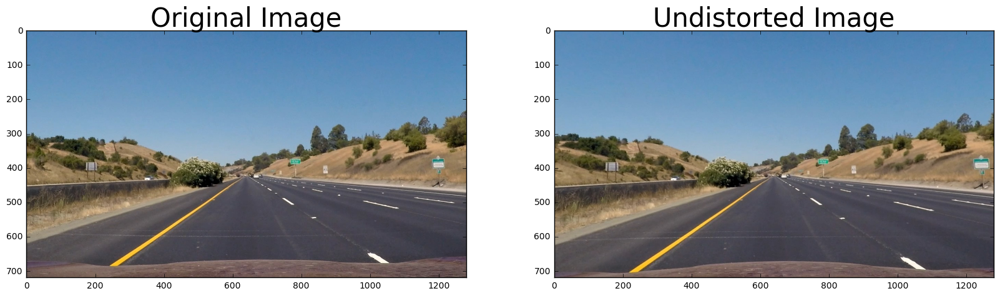

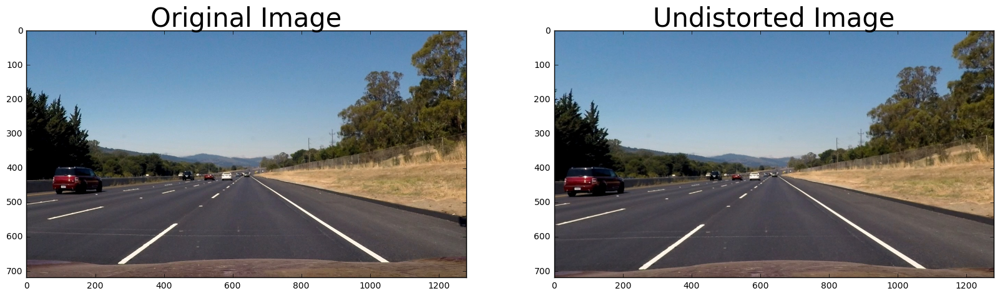

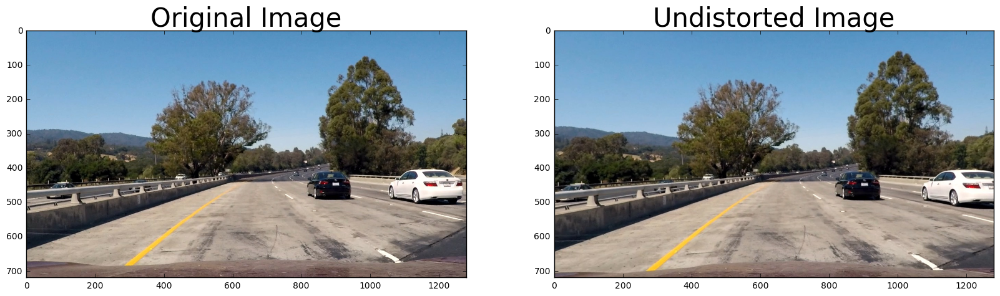

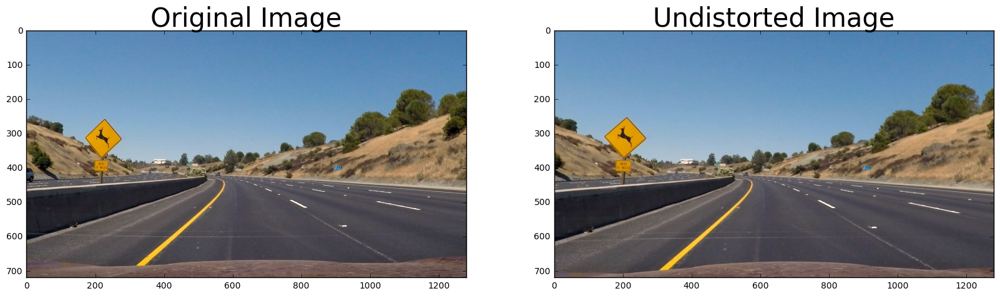

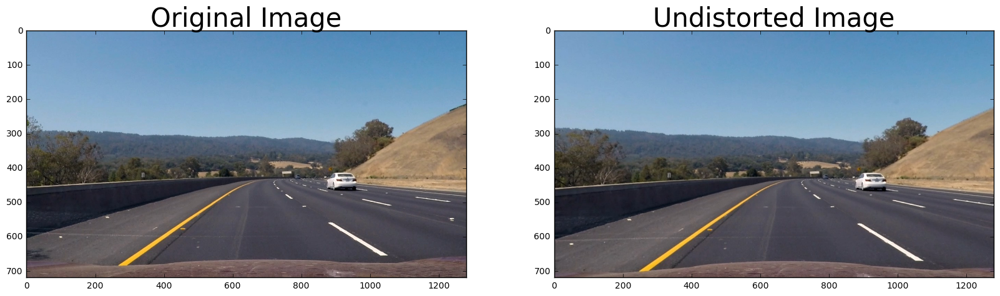

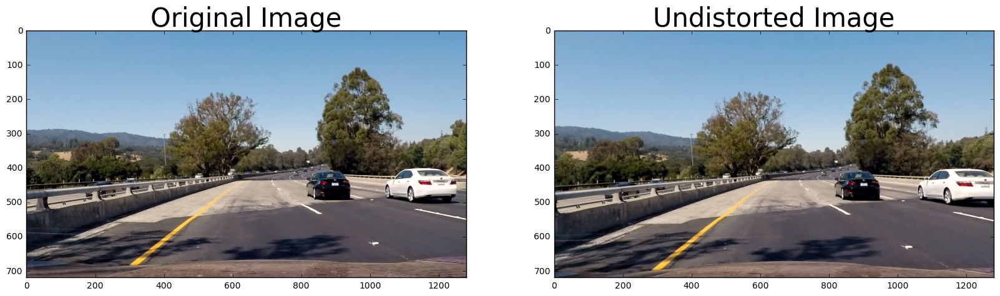

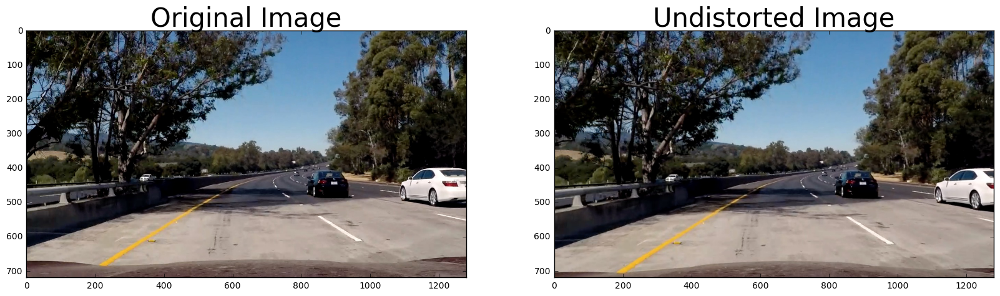

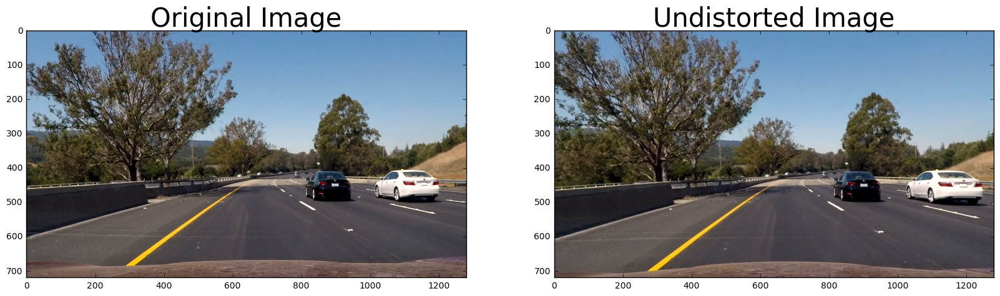

In [8]:
'''Undistort Test Images'''
test_images = glob.glob(TEST_IMAGES)
undist_test_images = undistort_images_list(test_images, mtx, dist, save_mode=True)

In [9]:
def get_undistorted_image(image, mtx, dist, debug_mode=False):
    undistorted_image = cv2.undistort(image, mtx, dist, None, mtx)
    if debug_mode:
        plot_image_set([image, undistorted_image], titles=['Input Image', 'Undistorted Image'])
    return undistorted_image

In [10]:
def road_view_to_birds_eye_view(image, file, debug_mode=False, save_mode=False):
    filename = fname.split('.')[0].split('/')[-1]
    fileformat = fname.split('.')[-1]
    image_size = (image.shape[1], image.shape[0])
    src = np.float32([[550, 469], [740, 469], [180, 720], [1155, 720]])
    dest = np.float32([[120, 0], [1150, 0], [120, 720], [1150, 720]])
    M = cv2.getPerspectiveTransform(src, dest)
    tranformed_image = cv2.warpPerspective(image, M, image_size, flags=cv2.INTER_LINEAR)
    if debug_mode:
        plot_image_set([image, tranformed_image], titles=['Road View Image', "Bird's Eye View Image"])
    if save_mode:
        if os.path.exists('{}/{}'.format(BIRDS_EYE_VIEW_IMAGES_DIR, filename)):
            shutil.rmtree('{}/{}'.format(BIRDS_EYE_VIEW_IMAGES_DIR, filename))
        os.makedirs('{}/{}'.format(BIRDS_EYE_VIEW_IMAGES_DIR, filename))
        mpimg.imsave('{}/{}/original.{}'.format(BIRDS_EYE_VIEW_IMAGES_DIR, filename, fileformat), image)
        mpimg.imsave('{}/{}/birds_eye.{}'.format(BIRDS_EYE_VIEW_IMAGES_DIR, filename, fileformat), tranformed_image)
    return tranformed_image

In [ ]:
def birds_eye_view_to_road_view(image, file, debug_mode=False, save_mode=False):
    filename = fname.split('.')[0].split('/')[-1]
    fileformat = fname.split('.')[-1]
    image_size = (image.shape[1], image.shape[0])
    src = np.float32([[550, 469], [740, 469], [180, 720], [1155, 720]])
    dest = np.float32([[120, 0], [1150, 0], [120, 720], [1150, 720]])
    M = cv2.getPerspectiveTransform(dest, src)
    tranformed_image = cv2.warpPerspective(image, M, image_size, flags=cv2.INTER_LINEAR)
    if debug_mode:
        plot_image_set([image, tranformed_image], titles=["Bird's Eye View Image", "Road View Image"])
    if save_mode:
        if os.path.exists('{}/{}'.format(BIRDS_EYE_TO_ROAD_VIEW_IMAGES_DIR, filename)):
            shutil.rmtree('{}/{}'.format(BIRDS_EYE_TO_ROAD_VIEW_IMAGES_DIR, filename))
        os.makedirs('{}/{}'.format(BIRDS_EYE_TO_ROAD_VIEW_IMAGES_DIR, filename))
        mpimg.imsave('{}/{}/original.{}'.format(BIRDS_EYE_TO_ROAD_VIEW_IMAGES_DIR, filename, fileformat), image)
        mpimg.imsave('{}/{}/road_view.{}'.format(BIRDS_EYE_TO_ROAD_VIEW_IMAGES_DIR, filename, fileformat), tranformed_image)
    return tranformed_image

In [ ]:
for idx, fname in enumerate(glob.glob(TEST_IMAGES)):
    image = plt.imread(fname)
    undist_image = get_undistorted_image(image,mtx,dist)
    result = road_view_to_birds_eye_view(undist_image, fname, debug_mode=True, save_mode=True)

In [ ]:
def get_red_channel_thresh(image, file, debug_mode=False, save_mode=False):
    red_channel = image[:,:,0]
    min_thresh = 220
    max_thresh = 255
    _, red_thresh = cv2.threshold(red_channel, min_thresh, max_thresh, cv2.THRESH_BINARY)
    if debug_mode:
        plot_image_set([image, red_thresh], titles=['Input Image', 'Red Channel RGB'], image_type='gray')
    if save_mode:
        if os.path.exists('{}/{}'.format(RED_CHANNEL_THRESH_IMAGES_DIR, filename)):
            shutil.rmtree('{}/{}'.format(RED_CHANNEL_THRESH_IMAGES_DIR, filename))
            os.makedirs('{}/{}'.format(RED_CHANNEL_THRESH_IMAGES_DIR, filename))
            mpimg.imsave('{}/{}/original.{}'.format(RED_CHANNEL_THRESH_IMAGES_DIR, filename, fileformat), image)
            mpimg.imsave('{}/{}/red_thresh.{}'.format(RED_CHANNEL_THRESH_IMAGES_DIR, filename, fileformat), red_thresh)
    return red_thresh
    
    
def get_yellow_color_thresh(image, file, debug_mode=False, save_mode=False):
    filename = fname.split('.')[0].split('/')[-1]
    fileformat = fname.split('.')[-1]
    hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    hsv_thresh_min_yellow = (10, 100, 100)
    hsv_thresh_max_yellow = (50, 255, 255)
    yellow_line = cv2.inRange(hsv_image, hsv_thresh_min_yellow, hsv_thresh_max_yellow)
    if debug_mode:
        plot_image_set([image, yellow_line], titles=['Input Image', 'Yellow Line HSV'], image_type='gray')
    if save_mode:
        if os.path.exists('{}/{}'.format(YELLOW_HSV_THRESH_IMAGES_DIR, filename)):
                shutil.rmtree('{}/{}'.format(YELLOW_HSV_THRESH_IMAGES_DIR, filename))
        os.makedirs('{}/{}'.format(YELLOW_HSV_THRESH_IMAGES_DIR, filename))
        mpimg.imsave('{}/{}/original.{}'.format(YELLOW_HSV_THRESH_IMAGES_DIR, filename, fileformat), image)
        mpimg.imsave('{}/{}/yellow_hsv.{}'.format(YELLOW_HSV_THRESH_IMAGES_DIR, filename, fileformat), yellow_line)
    return yellow_line


def get_white_color_thresh(image, file, debug_mode=False, save_mode=False):
    filename = fname.split('.')[0].split('/')[-1]
    fileformat = fname.split('.')[-1]
    #HSV
    hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    hsv_thresh_min_white = (50, 0, 180)
    hsv_thresh_max_white = (255, 100, 255)
    white_line1 = cv2.inRange(hsv_image, hsv_thresh_min_white, hsv_thresh_max_white)
    
    #HSL
    hls_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    hls_thresh_min_white = (0, 200, 200)
    hls_thresh_max_white = (255, 255, 255)
    white_line2 = cv2.inRange(hls_image, hls_thresh_min_white, hls_thresh_max_white)
    
    #Normal White Color
    rgb_thresh_min_white = (220,220,220)
    rgb_thresh_max_white = (255,255,255)
    white_line3 = cv2.inRange(image, rgb_thresh_min_white, rgb_thresh_max_white)
    
    white_line = white_line1 | white_line2 | white_line3
    
    if debug_mode:
        plot_image_set([image, white_line1], titles=['Input Image', 'White Line HSV'], image_type='gray')
        plot_image_set([image, white_line2], titles=['Input Image', 'White Line HSL'], image_type='gray')
        plot_image_set([image, white_line3], titles=['Input Image', 'White Line RGB'], image_type='gray')
        plot_image_set([image, white_line], titles=['Input Image', 'Combined White Line'], image_type='gray')
    
    if save_mode:
        if os.path.exists('{}/{}'.format(WHITE_HSV_THRESH_IMAGES_DIR, filename)):
            shutil.rmtree('{}/{}'.format(WHITE_HSV_THRESH_IMAGES_DIR, filename))
        os.makedirs('{}/{}'.format(WHITE_HSV_THRESH_IMAGES_DIR, filename))
        mpimg.imsave('{}/{}/original.{}'.format(WHITE_HSV_THRESH_IMAGES_DIR, filename, fileformat), image)
        mpimg.imsave('{}/{}/white_hsv.{}'.format(WHITE_HSV_THRESH_IMAGES_DIR, filename, fileformat), white_line1)
        
        if os.path.exists('{}/{}'.format(WHITE_HLS_THRESH_IMAGES_DIR, filename)):
            shutil.rmtree('{}/{}'.format(WHITE_HLS_THRESH_IMAGES_DIR, filename))
        os.makedirs('{}/{}'.format(WHITE_HLS_THRESH_IMAGES_DIR, filename))
        mpimg.imsave('{}/{}/original.{}'.format(WHITE_HLS_THRESH_IMAGES_DIR, filename, fileformat), image)
        mpimg.imsave('{}/{}/white_hls.{}'.format(WHITE_HLS_THRESH_IMAGES_DIR, filename, fileformat), white_line2)
        
        if os.path.exists('{}/{}'.format(WHITE_NORMAL_THRESH_IMAGES_DIR, filename)):
            shutil.rmtree('{}/{}'.format(WHITE_NORMAL_THRESH_IMAGES_DIR, filename))
        os.makedirs('{}/{}'.format(WHITE_NORMAL_THRESH_IMAGES_DIR, filename))
        mpimg.imsave('{}/{}/original.{}'.format(WHITE_NORMAL_THRESH_IMAGES_DIR, filename, fileformat), image)
        mpimg.imsave('{}/{}/white_hls.{}'.format(WHITE_NORMAL_THRESH_IMAGES_DIR, filename, fileformat), white_line3)
        
        if os.path.exists('{}/{}'.format(COMBINED_WHITE_THRESH_IMAGES_DIR, filename)):
            shutil.rmtree('{}/{}'.format(COMBINED_WHITE_THRESH_IMAGES_DIR, filename))
        os.makedirs('{}/{}'.format(COMBINED_WHITE_THRESH_IMAGES_DIR, filename))
        mpimg.imsave('{}/{}/original.{}'.format(COMBINED_WHITE_THRESH_IMAGES_DIR, filename, fileformat), image)
        mpimg.imsave('{}/{}/combined_white.{}'.format(COMBINED_WHITE_THRESH_IMAGES_DIR, filename, fileformat), white_line)
    
    return white_line


def apply_color_thresholds(image, file, debug_mode=False, save_mode=False):
    filename = fname.split('.')[0].split('/')[-1]
    fileformat = fname.split('.')[-1]
    red_channel_thresh = get_red_channel_thresh(image, file, debug_mode=debug_mode)
    yellow_thresh = get_yellow_color_thresh(image, file, debug_mode=debug_mode)
    white_thresh = get_white_color_thresh(image, file, debug_mode=debug_mode)
    combined_binary = red_channel_thresh | yellow_thresh | white_thresh
    
    if debug_mode:
        plot_image_set([image, combined_binary], titles=['Input Image', 'Combined Binary Threshold Image'], 
                                                                                        image_type='gray')
    if save_mode:
        if os.path.exists('{}/{}'.format(COMBINED_COLOR_THRESH_IMAGES_DIR, filename)):
            shutil.rmtree('{}/{}'.format(COMBINED_COLOR_THRESH_IMAGES_DIR, filename))
        os.makedirs('{}/{}'.format(COMBINED_COLOR_THRESH_IMAGES_DIR, filename))
        mpimg.imsave('{}/{}/original.{}'.format(COMBINED_COLOR_THRESH_IMAGES_DIR, filename, fileformat), image)
        mpimg.imsave('{}/{}/combined_color.{}'.format(COMBINED_COLOR_THRESH_IMAGES_DIR, filename, fileformat), combined_binary)
    return combined_binary

In [ ]:
for idx, fname in enumerate(glob.glob(TEST_IMAGES)):
    image = plt.imread(fname)
    undist_image = get_undistorted_image(image,mtx,dist)
    birds_eye = road_view_to_birds_eye_view(undist_image, fname)
    thresh_image = apply_color_thresholds(birds_eye, fname, save_mode=True)

In [ ]:
def get_line_points_sliding(binary_warped):
    image_height = binary_warped.shape[0]
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    nwindows = 20
    window_height = np.int(binary_warped.shape[0]/nwindows)
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    leftx_current = leftx_base
    rightx_current = rightx_base
    margin = 100
    minpix = 50

    left_lane_inds = []
    right_lane_inds = []
    
    for window in range(nwindows):
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    left_coeffs = np.polyfit(lefty, leftx, 2)
    right_coeffs = np.polyfit(righty, rightx, 2)

    return left_coeffs, right_coeffs


def get_lines_from_existing(binary_warped, left_coeffs, right_coeffs):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    
    left_eq = np.poly1d(left_coeffs)
    right_eq = np.poly1d(right_coeffs)
    
    left_lane_inds = ((nonzerox > (left_eq(nonzeroy) - margin)) & (nonzerox < (left_eq(nonzeroy) + margin))) 
    right_lane_inds = ((nonzerox > (right_eq(nonzeroy) - margin)) & (nonzerox < (right_eq(nonzeroy) + margin)))
    
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_coeffs = np.polyfit(lefty, leftx, 2)
    right_coeffs = np.polyfit(righty, rightx, 2)
    
    return left_coeffs, right_coeffs


def radius_curvature_and_position(image, left_points, right_points, left_coeffs, right_coeffs):
    ym_per_pix = 30/720 
    xm_per_pix = 3.7/700
    image_height, image_width = image.shape[0], image.shape[1]
    left_fit_cr = np.polyfit(np.int32(left_points[1])*ym_per_pix, np.int32(left_points[0])*xm_per_pix, 2)
    right_fit_cr = np.polyfit(np.int32(right_points[1])*ym_per_pix, np.int32(right_points[0])*xm_per_pix, 2)
    left_curve_radius = ((1 + (2*left_fit_cr[0]*np.max(left_points[0]) + left_fit_cr[1])**2)**1.5)/np.absolute(2*left_fit_cr[0])
    right_curve_radius = ((1 + (2*right_fit_cr[0]*np.max(left_points[0]) + right_fit_cr[1])**2)**1.5)/np.absolute(2*right_fit_cr[0])    
    radius_of_curvature = (left_curve_radius + right_curve_radius)/2
    
    left_most_bottom_int = left_coeffs[0]*image_height**2 + left_coeffs[1]*image_height + left_coeffs[2]
    right_most_bottom_int = right_coeffs[0]*image_height**2 + right_coeffs[1]*image_height + right_coeffs[2]
    center_pos = abs(image_width/2 - (left_most_bottom_int+ right_most_bottom_int)/2)
    position = center_pos*3.7/700
    
    if center_pos < image_width/2:
        position_type = 'left'
    else:
        position_type = 'right'
    return radius_of_curvature, position, position_type


def draw_polygon(image, left_coeffs, right_coeffs, file, debug_mode=False, save_mode=False):
    filename = fname.split('.')[0].split('/')[-1]
    fileformat = fname.split('.')[-1]
    copied_image = image.copy()
    final_image = image.copy()
    left_points = []
    right_points = []
    
    left_eq = np.poly1d(left_coeffs)
    right_eq = np.poly1d(right_coeffs)
    
    for y in range(720):
        x = int(left_eq(y))
        if x < 0:
            pass
        else:
            left_points.append([x,y])

    for y in range(720):
        x = int(right_eq(y))
        if x < 0:
            pass
        else:
            right_points.append([x,y])
    
    polygon_points = left_points + right_points[::-1]
    
    copied_image2 = np.zeros_like(image)
    copied_image2 = cv2.polylines(copied_image2, np.array([left_points]), isClosed=False, color=(255,0,0), thickness=50)
    copied_image2 = cv2.polylines(copied_image2, np.array([right_points]), isClosed=False, color=(0,0,255), thickness=50)
    final_image = cv2.fillPoly(final_image, [np.array(polygon_points)], color=(102,255,102))
    radius_of_curvature, position, position_type = radius_curvature_and_position(final_image, left_points, right_points, 
                                                                                 left_coeffs, right_coeffs)
        
    if save_mode:
        if os.path.exists('{}/{}'.format(LINES_ON_TEST_IMAGES, filename)):
            shutil.rmtree('{}/{}'.format(LINES_ON_TEST_IMAGES, filename))
        os.makedirs('{}/{}'.format(LINES_ON_TEST_IMAGES, filename))
        mpimg.imsave('{}/{}/combined_lines.{}'.format(LINES_ON_TEST_IMAGES, filename, fileformat), copied_image2)
        
        if os.path.exists('{}/{}'.format(POLYGON_ON_TEST_IMAGES, filename)):
            shutil.rmtree('{}/{}'.format(POLYGON_ON_TEST_IMAGES, filename))
        os.makedirs('{}/{}'.format(POLYGON_ON_TEST_IMAGES, filename))
        mpimg.imsave('{}/{}/polygon_image.{}'.format(POLYGON_ON_TEST_IMAGES, filename, fileformat), final_image)
        
    return final_image, radius_of_curvature, position, position_type


def get_polygon_area(image, file, debug_mode=False, save_mode=False):
    left_coeffs, right_coeffs = get_line_points_sliding(image)
    color_channel_image = np.zeros_like(image).astype(np.uint8)
    color_channel_image = np.dstack((color_channel_image, color_channel_image, color_channel_image))
    polygon_image, radius_of_curvature, position, position_type = draw_polygon(color_channel_image, left_coeffs, 
                                                            right_coeffs, file, debug_mode=debug_mode, save_mode=save_mode)
    
    return polygon_image, radius_of_curvature, position, position_type

In [ ]:
for idx, fname in enumerate(glob.glob(TEST_IMAGES)):
    image = plt.imread(fname)
    undist_image = get_undistorted_image(image,mtx,dist)
    birds_eye = road_view_to_birds_eye_view(undist_image, fname)
    thresh_image = apply_color_thresholds(birds_eye, fname)
    polygon_image_birds_view = get_polygon_area(thresh_image, fname, debug_mode=False, save_mode=True)

In [ ]:
def add_weight_to_image(image1, image2, debug_mode=False):
    result_image = cv2.addWeighted(image1, 1, image2, 0.8, 0)
    if debug_mode:
        plot_image_set([image1, result_image], titles=['Original Image', 'Final Image'])
    return result_image

In [ ]:
def add_curvature_position_info(image, radius_of_curvature, position, position_type, file, save_mode=False):
    filename = fname.split('.')[0].split('/')[-1]
    fileformat = fname.split('.')[-1]
    cv2.putText(image, "Radius of Curvature - {:.2f}m".format(radius_of_curvature), (200, 100), cv2.FONT_HERSHEY_DUPLEX, 1, (255,255,255), 2)
    cv2.putText(image, "Car is {:.2f}m {} from center".format(position, position_type), (200, 150), cv2.FONT_HERSHEY_DUPLEX, 1, (255,255,255), 2)
    if save_mode:
        if os.path.exists('{}/{}'.format(FINAL_IMAGES, filename)):
            shutil.rmtree('{}/{}'.format(FINAL_IMAGES, filename))
        os.makedirs('{}/{}'.format(FINAL_IMAGES, filename))
        mpimg.imsave('{}/{}/final_image.{}'.format(FINAL_IMAGES, filename, fileformat), image)
        
    return image

In [ ]:
def test_image_pipeline(image, file):
    global mtx
    global dist
    try:
        kernel_size = 5
        undist_img = get_undistorted_image(image, mtx, dist)
        pers_trans = road_view_to_birds_eye_view(undist_img, file)
        bin_image = apply_color_thresholds(pers_trans, file)
        polygon_image_birds_eye, radius_of_curvature, position, position_type = get_polygon_area(bin_image, file)
        polygon_image_normal_view = birds_eye_view_to_road_view(polygon_image_birds_eye, file)
        weighted_image = add_weight_to_image(image, polygon_image_normal_view)
        final_image = add_curvature_position_info(weighted_image, radius_of_curvature, position, position_type, 
                                                  file, save_mode=True)
        plot_image_set([image, final_image], titles=['Original', 'Final'])
    except Exception as ex:
        print(ex)
        return image
    return final_image

In [ ]:
test_images = glob.glob(TEST_IMAGES)
for idx, fname in enumerate(test_images):
    image = mpimg.imread(fname)
    test_image_pipeline(image, fname)